In [219]:
from etherscan import Etherscan
import pandas as pd
import numpy as np
import time
import networkx as nx
from collections import Counter
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import power
import networkx.algorithms.community as nx_com
from networkx.algorithms.community.centrality import girvan_newman

In [2]:
eth = Etherscan('R52XJK3VM8EIZ5CWWTS1B6ZBWX229MTKD3')

In [16]:
eth_accounts_frame = pd.read_excel("/home/b/Downloads/Adresses.xlsx", sheet_name = 'Ethereum')

In [17]:
eth_accounts = eth_accounts_frame['account']

In [18]:
eth_accounts

0      0xc02aaa39b223fe8d0a0e5c4f27ead9083c756cc2
1      0x629e7da20197a5429d30da36e77d06cdf796b71a
2      0xbf4ed7b27f1d666546e30d74d50d173d20bca754
3      0x500a746c9a44f68fe6aa86a92e7b3af4f322ae66
4      0x220866b1a2219f40e72f5c628b65d54268ca3a9d
                          ...                    
295    0x565b8fbf9336bec8fbfb4f78fbf30d7f70d6973b
296    0xe780a56306ba1e6bb331952c22539b858af9f77d
297    0x31c84a968736fcfe02a9ba274e0fa515a4a6659c
298    0x896dfee1afeb6336e86911bd5a341c1264e5611a
299    0xa77fe4592675e319ca07f7b07cf48f953b8b9000
Name: account, Length: 300, dtype: object

In [80]:
r2 = eth.get_normal_txs_by_address(address = '0x31c84a968736fcfe02a9ba274e0fa515a4a6659c',
                                       startblock = 0,endblock=99999999,sort='asc')

AssertionError: [] -- No transactions found

In [24]:
len(r2)

2

In [38]:
r2

[{'blockNumber': '15701297',
  'timeStamp': '1665207119',
  'hash': '0xcd468e4c362a1c714c0b22e92272e7fb4f528f5a0d73ef2dc4a15d88de101c30',
  'nonce': '1',
  'blockHash': '0xa899b31251b94ebafac052f8ac665c48345aadaeb67fa4dd3685f3963326a935',
  'transactionIndex': '133',
  'from': '0x4817d93d9b229e0771db0b7c970573d4dd953c4a',
  'to': '0x9030dcb01830eaa3d8ba285a824a05d8fb489ad0',
  'value': '56311102020225194579000',
  'gas': '21000',
  'gasPrice': '5729386965',
  'isError': '0',
  'txreceipt_status': '1',
  'input': '0x',
  'contractAddress': '',
  'cumulativeGasUsed': '15534795',
  'gasUsed': '21000',
  'confirmations': '414584',
  'methodId': '0x',
  'functionName': ''},
 {'blockNumber': '15701303',
  'timeStamp': '1665207191',
  'hash': '0x16a3f494a9a0c76b1a24e4137e1000815d7ff75865f7e4e6479d8d5ebcdedf66',
  'nonce': '9',
  'blockHash': '0xe7aa65b0b9b0b073cce56f2f94753ef66558d1d1b1e7681a7a1c7d65bb0ec4e4',
  'transactionIndex': '74',
  'from': '0xf7dc577b1330fca9fce9c2c710b4523ea20728b7',

In [57]:
def extract_txs(etherscan_tx_list):
    tx_extract = np.array([])
   

    if(len(etherscan_tx_list) == 10_000):
        print('blockHash:' + etherscan_tx_list[0]['blockHash'])
        print("OVER 10K TX's!!!!!")
        return
    
    
    
    for n in etherscan_tx_list:
        if(n['isError'] == '0'):
            tx = {'from':n['from'],'to':n['to'],'value':(float(n['value']) * 0.000000000000000001),'time':n['timeStamp']}
            tx_extract = np.append(tx_extract,tx)
           
        
    return tx_extract

In [58]:
final = extract_txs(r2)

In [59]:
final

array([{'from': '0x4817d93d9b229e0771db0b7c970573d4dd953c4a', 'to': '0x9030dcb01830eaa3d8ba285a824a05d8fb489ad0', 'value': 56311.1020202252, 'time': '1665207119'},
       {'from': '0xf7dc577b1330fca9fce9c2c710b4523ea20728b7', 'to': '0x9030dcb01830eaa3d8ba285a824a05d8fb489ad0', 'value': 35916.050422605884, 'time': '1665207191'}],
      dtype=object)

In [30]:
dict(r2[1]

{'blockNumber': '15701303',
 'timeStamp': '1665207191',
 'hash': '0x16a3f494a9a0c76b1a24e4137e1000815d7ff75865f7e4e6479d8d5ebcdedf66',
 'nonce': '9',
 'blockHash': '0xe7aa65b0b9b0b073cce56f2f94753ef66558d1d1b1e7681a7a1c7d65bb0ec4e4',
 'transactionIndex': '74',
 'from': '0xf7dc577b1330fca9fce9c2c710b4523ea20728b7',
 'to': '0x9030dcb01830eaa3d8ba285a824a05d8fb489ad0',
 'value': '35916050422605879537000',
 'gas': '21000',
 'gasPrice': '6103948056',
 'isError': '0',
 'txreceipt_status': '1',
 'input': '0x',
 'contractAddress': '',
 'cumulativeGasUsed': '6700083',
 'gasUsed': '21000',
 'confirmations': '414578',
 'methodId': '0x',
 'functionName': ''}

In [60]:
address_excel = pd.read_excel("/home/b/Downloads/Adressesv2.xlsx", sheet_name = 'Ethereum')

In [63]:
accounts = address_excel['account']
accounts

0      0xb8d2b921c0ea0ca27266fa63907a079ef25084d0
1      0xcafea35ce5a2fc4ced4464da4349f81a122fd12b
2      0x203520f4ec42ea39b03f62b20e20cf17db5fdfa7
3      0xbd02c51150a4ab6ce97b9de2025644594f3e75b8
4      0xca0a044400c1fa857e4cd0c95d86376b85659303
                          ...                    
224    0x4920f22b632bfaa40af8d39c31d9607809485952
225    0x8c3389616404fda275cfdba0c7b0b3d1fee9ebdc
226    0xe3f53355cdbeaf2afafc4fc22be0a5c02570061a
227    0x31c84a968736fcfe02a9ba274e0fa515a4a6659c
228    0x896dfee1afeb6336e86911bd5a341c1264e5611a
Name: account, Length: 229, dtype: object

In [67]:
test = np.append(final,final)

In [68]:
test

array([{'from': '0x4817d93d9b229e0771db0b7c970573d4dd953c4a', 'to': '0x9030dcb01830eaa3d8ba285a824a05d8fb489ad0', 'value': 56311.1020202252, 'time': '1665207119'},
       {'from': '0xf7dc577b1330fca9fce9c2c710b4523ea20728b7', 'to': '0x9030dcb01830eaa3d8ba285a824a05d8fb489ad0', 'value': 35916.050422605884, 'time': '1665207191'},
       {'from': '0x4817d93d9b229e0771db0b7c970573d4dd953c4a', 'to': '0x9030dcb01830eaa3d8ba285a824a05d8fb489ad0', 'value': 56311.1020202252, 'time': '1665207119'},
       {'from': '0xf7dc577b1330fca9fce9c2c710b4523ea20728b7', 'to': '0x9030dcb01830eaa3d8ba285a824a05d8fb489ad0', 'value': 35916.050422605884, 'time': '1665207191'}],
      dtype=object)

In [112]:
all_txs = np.array([])
for n in accounts[:-2]:
    data_dump = eth.get_normal_txs_by_address(address = n,
                                       startblock = 0,endblock=99999999,sort='asc')
    
    tx_pull = extract_txs(data_dump)
    all_txs = np.append(all_txs,tx_pull)

In [113]:
len(all_txs)

34809

In [114]:
all_txs

array([{'from': '0xa04afbe1ba0549ee19e055bc8eed84d4a3d7ee6c', 'to': '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 'value': 0.0, 'time': '1528671850'},
       {'from': '0xa04afbe1ba0549ee19e055bc8eed84d4a3d7ee6c', 'to': '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 'value': 0.0, 'time': '1528672044'},
       {'from': '0x29d5527caa78f1946a409fa6acaf14a0a4a0274b', 'to': '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 'value': 0.1, 'time': '1528675631'},
       ...,
       {'from': '0x876eabf441b2ee5b5b0554fd502a8e0600950cfa', 'to': '0x4920f22b632bfaa40af8d39c31d9607809485952', 'value': 67312.7120218, 'time': '1611233751'},
       {'from': '0x876eabf441b2ee5b5b0554fd502a8e0600950cfa', 'to': '0x8c3389616404fda275cfdba0c7b0b3d1fee9ebdc', 'value': 57624.53522639, 'time': '1611392958'},
       {'from': '0x77134cbc06cb00b66f4c7e623d5fdbf6777635ec', 'to': '0xe3f53355cdbeaf2afafc4fc22be0a5c02570061a', 'value': 53242.56373701, 'time': '1668732575'}],
      dtype=object)

In [92]:
all_txs

array([{'from': '0xa04afbe1ba0549ee19e055bc8eed84d4a3d7ee6c', 'to': '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 'value': 0.0, 'time': '1528671850'},
       {'from': '0xa04afbe1ba0549ee19e055bc8eed84d4a3d7ee6c', 'to': '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 'value': 0.0, 'time': '1528672044'},
       {'from': '0x29d5527caa78f1946a409fa6acaf14a0a4a0274b', 'to': '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 'value': 0.1, 'time': '1528675631'},
       ...,
       {'from': '0x876eabf441b2ee5b5b0554fd502a8e0600950cfa', 'to': '0x4920f22b632bfaa40af8d39c31d9607809485952', 'value': 67312.7120218, 'time': '1611233751'},
       {'from': '0x876eabf441b2ee5b5b0554fd502a8e0600950cfa', 'to': '0x8c3389616404fda275cfdba0c7b0b3d1fee9ebdc', 'value': 57624.53522639, 'time': '1611392958'},
       {'from': '0x77134cbc06cb00b66f4c7e623d5fdbf6777635ec', 'to': '0xe3f53355cdbeaf2afafc4fc22be0a5c02570061a', 'value': 53242.56373701, 'time': '1668732575'}],
      dtype=object)

In [101]:
G = nx.DiGraph()

In [102]:
for n in all_txs:
    G.add_edge(n['from'],n['to'],weight=n['value'])

In [103]:
len(G.nodes)

6707

In [104]:
len(G.edges)

7266

In [90]:
def graph_plotter(graph, clist):
    plt.figure(1,figsize=(10,10))
    mappable = plt.cm.ScalarMappable(cmap = plt.cm.jet, norm = plt.Normalize( vmin = min(clist), vmax = max(clist)))
    nx.draw(graph,pos=None,with_labels=False,node_size=50, cmap = plt.cm.jet ,node_color=clist,width=0.1)
    plt.colorbar(mappable)

In [91]:
G.degree

DiDegreeView({'0xa04afbe1ba0549ee19e055bc8eed84d4a3d7ee6c': 1, '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0': 1297, '0x29d5527caa78f1946a409fa6acaf14a0a4a0274b': 1, '0x73afb71d55a49e8bfbb64e652d98ff7d8fbfe50e': 1, '0x7e2f9620b82292829a309a7ec4f09e77fc61a5fd': 1, '0xd3b91ab87b134c4fb58fabd06ec5bf6df1ee12a9': 1, '0x390a8ee0d3229e65f858ae6d9d26c5b0da6acc28': 1, '0xe48c55b0768c9a6ca5151307ad32677f9f34e29e': 1, '0xfd36669394bacfcffd8d1549516fe0bf7f0f6d3b': 1, '0x483b1bcd5e5399f9c53c15680e3b61dd94e3d0b0': 1, '0x0ca3c47e73d02427a140c13bfa2c0ef977504cca': 1, '0x097b68a7b8bc6b37be834e3874506d8c1f2b55d0': 1, '0x47778a55f2776a57682739c79e72aac3b8054e2a': 1, '0x0491be6a10276f6e8db657a5f83b44c2cec64b5d': 1, '0xd42b680252fe220d2d4a388b6486cdbad188d107': 1, '0x4632926f58f996c404448f2ae6163186f019a006': 1, '0xccb33c7a129043b47973886afede9a072ca10bf3': 1, '0xddbc5e3db2721615f3eb5c86e4b0544c97dda862': 1, '0x892071f985bacaf229873838fb704d6c9f5644e7': 1, '0x1dfcfae8905f2f9a36d6d1856e3b5e510fe73f41': 1, '0x

In [105]:
degree_sequence = sorted((d for n, d in G.degree()), reverse=True)
dmax = max(degree_sequence)

In [106]:
dmax

1297

In [100]:
degree_sequence

[1297,
 1024,
 222,
 208,
 112,
 90,
 83,
 74,
 67,
 66,
 63,
 61,
 60,
 59,
 59,
 59,
 58,
 58,
 58,
 57,
 56,
 55,
 54,
 54,
 54,
 54,
 54,
 54,
 54,
 53,
 53,
 53,
 52,
 52,
 52,
 52,
 52,
 52,
 52,
 51,
 51,
 49,
 49,
 49,
 49,
 49,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 47,
 47,
 47,
 47,
 47,
 46,
 45,
 45,
 44,
 44,
 44,
 43,
 41,
 39,
 37,
 35,
 34,
 33,
 32,
 31,
 31,
 29,
 25,
 24,
 23,
 21,
 20,
 20,
 19,
 19,
 18,
 18,
 18,
 17,
 17,
 17,
 17,
 17,
 16,
 16,
 16,
 16,
 16,
 16,
 15,
 15,
 15,
 15,
 14,
 14,
 13,
 13,
 13,
 13,
 13,
 12,
 12,
 12,
 12,
 11,
 11,
 11,
 11,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 9,
 9,
 9,
 9,
 9,
 9,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 3,


In [109]:
sorted(G.in_degree, key=lambda x: x[1], reverse=True)

[('0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 1297),
 ('0xcafea35ce5a2fc4ced4464da4349f81a122fd12b', 1024),
 ('0xd83faada51552a9cbc153a295c5e5d08b7dc4cd3', 206),
 ('0x1b3cb81e51011b549d78bf720b0d924ac763a7c2', 110),
 ('0x35aeed3aa9657abf8b847038bb591b51e1e4c69f', 66),
 ('0xf481b7fab9f5d0e74f21ae595a749634fb053619', 63),
 ('0xb93d8596ac840816bd366dc0561e8140afd0d1cb', 60),
 ('0x303c741bb15c9c4b1c72320f6df702b32da80519', 59),
 ('0xd5268a476aadd1a6729df5b3e5e8f2c1004139af', 59),
 ('0x6e414cfad874d8ee716ea0299d40011207c907b8', 58),
 ('0x3f4ac8d3e1414b5351e632391908177c012c65cc', 58),
 ('0xdb3c617cdd2fbf0bb4309c325f47678e37f096d9', 58),
 ('0x4ed97d6470f5121a8e02498ea37a50987da0eec0', 57),
 ('0x7ead3a4361bd26a20deb89c9470be368ee9cb6f1', 56),
 ('0x1bd3fc5ac794e7af8e834a8a4d25b08acd9266ce', 55),
 ('0x2d1566722288be5525b548a642c98b546f116aa0', 54),
 ('0xad0d53cf033ab63dc72d653640766ee1d366cef6', 54),
 ('0x1b7b5b4bed048d86976d7cf51d9c4ea24e20ade7', 54),
 ('0x19bf56fca395a600c20f732b05757f30ad2

In [110]:
sorted(G.out_degree, key=lambda x: x[1], reverse=True)

[('0xa43d2e05ed00c040c8422a88cb8ede921a539f92', 221),
 ('0xc882b111a75c0c657fc507c04fbfcd2cc984f071', 79),
 ('0x203520f4ec42ea39b03f62b20e20cf17db5fdfa7', 75),
 ('0x0e6c19fc28ecb92f4a9cae966cfe93b6710c9c8e', 67),
 ('0x7d6149ad9a573a6e2ca6ebf7d4897c1b766841b4', 65),
 ('0xeb2629a2734e272bcc07bda959863f316f4bd4cf', 61),
 ('0xb5d85cbf7cb3ee0d56b3bb207d5fc4b82f43f511', 54),
 ('0x3cd751e6b0078be393132286c442345e5dc49699', 51),
 ('0xddfabcdc4d8ffc6d5beaf154f18b778f892a0740', 46),
 ('0x8759b0b1d9cba80e3836228dfb982abaa2c48b97', 42),
 ('0x7f3a1e45f67e92c880e573b43379d71ee089db54', 40),
 ('0x46f80018211d5cbbc988e853a8683501fca4ee9b', 33),
 ('0x464c6caba28e0806a77eda7851905df52d1b7266', 23),
 ('0xa0e239b0abf4582366adaff486ee268c848c4409', 23),
 ('0x9e927c02c9eadae63f5efb0dd818943c7262fb8e', 22),
 ('0x611f97d450042418e7338cbdd19202711563df01', 20),
 ('0x7700edddd3fc34c18fe2ab14b5345f1596d10553', 19),
 ('0x1ec4de886d40d487366cde7664767db1df6a02e7', 18),
 ('0x7b7b0ed51582c395970e5671048de70a04a7be51

ConversionError: Failed to convert value(s) to axis units: ('GENESIS', 0)

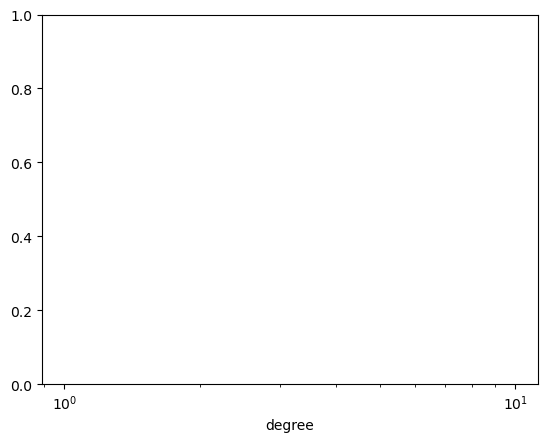

In [116]:
degrees = G.in_degree()
degree_counts = Counter(degrees)                                                                                                 
x, y = zip(*degree_counts.items())                                                      
                                                                                                 
plt.figure(1)   
                                                                                                                                                                                                                                                      
# prep axes                                                                                                                      
plt.xlabel('degree')                                                                                                             
plt.xscale('log')                                                                                                                
plt.xlim(1, max(x))  
                                                                                                           
plt.ylabel('frequency')                                                                                                          
plt.yscale('log')                                                                                                                
plt.ylim(1, max(y))                                                                                                             
                                                                                                                                     # do plot                                                                                                                        
plt.scatter(x, y, marker='.')                                                                                                    
plt.show()

In [119]:
def plot_degree_histogram(g, normalized=True, weight=None):
    
    degree_sequence = sorted([d for n, d in g.degree(weight=weight)], reverse=True)  # degree sequence
    degreeCount = collections.Counter(degree_sequence)
    aux_x, aux_y = zip(*degreeCount.items())

    n_nodes = g.number_of_nodes()
    aux_y = list(aux_y)
    if normalized:
        for i in range(len(aux_y)):
            aux_y[i] = aux_y[i]/n_nodes
    
    return aux_x, aux_y

In [120]:
plot = plot_degree_histogram(G)

NameError: name 'collections' is not defined

In [132]:
def degree_histogram_directed(G, in_degree=False, out_degree=False):
    """Return a list of the frequency of each degree value.

    Parameters
    ----------
    G : Networkx graph
       A graph
    in_degree : bool
    out_degree : bool

    Returns
    -------
    hist : list
       A list of frequencies of degrees.
       The degree values are the index in the list.

    Notes
    -----
    Note: the bins are width one, hence len(list) can be large
    (Order(number_of_edges))
    """
    nodes = G.nodes()
    if in_degree:
        in_degree = dict(G.in_degree())
        degseq=[in_degree.get(k,0) for k in nodes]
    elif out_degree:
        out_degree = dict(G.out_degree())
        degseq=[out_degree.get(k,0) for k in nodes]
    else:
        degseq=[v for k, v in G.degree()]
    dmax=max(degseq)+1
    freq= [ 0 for d in range(dmax) ]
    for d in degseq:
        freq[d] += 1
    return freq

In [163]:
len(G.nodes)

6707

In [164]:
r = nx.erdos_renyi_graph(6700,.25,directed=True)

In [166]:
a = nx.barabasi_albert_graph(,7000)

NetworkXError: Barabási–Albert network must have m >= 1 and m < n, m = 7000, n = 1

In [156]:
all_txs

array([{'from': '0xa04afbe1ba0549ee19e055bc8eed84d4a3d7ee6c', 'to': '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 'value': 0.0, 'time': '1528671850'},
       {'from': '0xa04afbe1ba0549ee19e055bc8eed84d4a3d7ee6c', 'to': '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 'value': 0.0, 'time': '1528672044'},
       {'from': '0x29d5527caa78f1946a409fa6acaf14a0a4a0274b', 'to': '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 'value': 0.1, 'time': '1528675631'},
       ...,
       {'from': '0x876eabf441b2ee5b5b0554fd502a8e0600950cfa', 'to': '0x4920f22b632bfaa40af8d39c31d9607809485952', 'value': 67312.7120218, 'time': '1611233751'},
       {'from': '0x876eabf441b2ee5b5b0554fd502a8e0600950cfa', 'to': '0x8c3389616404fda275cfdba0c7b0b3d1fee9ebdc', 'value': 57624.53522639, 'time': '1611392958'},
       {'from': '0x77134cbc06cb00b66f4c7e623d5fdbf6777635ec', 'to': '0xe3f53355cdbeaf2afafc4fc22be0a5c02570061a', 'value': 53242.56373701, 'time': '1668732575'}],
      dtype=object)

In [187]:
len(al)

34809

In [198]:
len(bull_graph)

9543

In [214]:
bear_graph

array([{'from': '0xa01aa2196724a39290f465b3925e5dcafe7f2256', 'to': '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 'value': 2500.0, 'time': '1638230519'},
       {'from': '0xfc5119aee1834a0b61b6614f20a3a1051b24dbe6', 'to': '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 'value': 0.0, 'time': '1638243076'},
       {'from': '0x733e240342bf1a9c62c7a18ddf5de2e8b10e59b1', 'to': '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0', 'value': 0.0, 'time': '1638323773'},
       ...,
       {'from': '0xa86309988947559b6e72ef716c5058f479386c0f', 'to': '0x47bf6da8e0c2ff8212b2f95325359caf592e04c2', 'value': 0.0016005136804020002, 'time': '1669991351'},
       {'from': '0x876eabf441b2ee5b5b0554fd502a8e0600950cfa', 'to': '0xbed96d0840201011df1467379a5d311e0040073a', 'value': 103744.75950588, 'time': '1636912986'},
       {'from': '0x77134cbc06cb00b66f4c7e623d5fdbf6777635ec', 'to': '0xe3f53355cdbeaf2afafc4fc22be0a5c02570061a', 'value': 53242.56373701, 'time': '1668732575'}],
      dtype=object)

In [215]:
bear_G = nx.DiGraph()
for n in bear_graph:
    bear_G.add_edge(n['from'],n['to'],weight=n['value'])

In [203]:
bull_G = nx.DiGraph()
for n in bull_graph:
    bull_G.add_edge(n['from'],n['to'],weight=n['value'])

In [197]:
bull_graph = np.array([])
for n in all_txs:
    if ((int(n['time']) > 1596315258) & (int(n['time']) < 1635800058)):
        bull_graph = np.append(bull_graph,n)

In [199]:
bear_graph = np.array([])
for n in all_txs:
    if (int(n['time']) > 1635800058):
        bear_graph = np.append(bear_graph,n)

In [162]:
def graph_plotter(graph, clist):
    plt.figure(1,figsize=(10,10))
    mappable = plt.cm.ScalarMappable(cmap = plt.cm.jet, norm = plt.Normalize( vmin = min(clist), vmax = max(clist)))
    nx.draw(graph,pos=None,with_labels=False,node_size=50, cmap = plt.cm.jet ,node_color=clist,width=0.1)
    plt.colorbar(mappable)

In [206]:
def graph_plotter_norm(graph):
    plt.figure(1,figsize=(10,10))
    #mappable = plt.cm.ScalarMappable(cmap = plt.cm.jet, norm = plt.Normalize( vmin = min(clist), vmax = max(clist)))
    #pos = nx.spring_layout(G, k=0.15, iterations=20)
    nx.draw(graph,pos=None,with_labels=False,node_size=5,width=0.1)
    #plt.colorbar(mappable)

In [160]:
graph_plotter_norm(G)

KeyboardInterrupt: 

<Figure size 1000x1000 with 0 Axes>

Text(0, 0.5, 'Frequency')

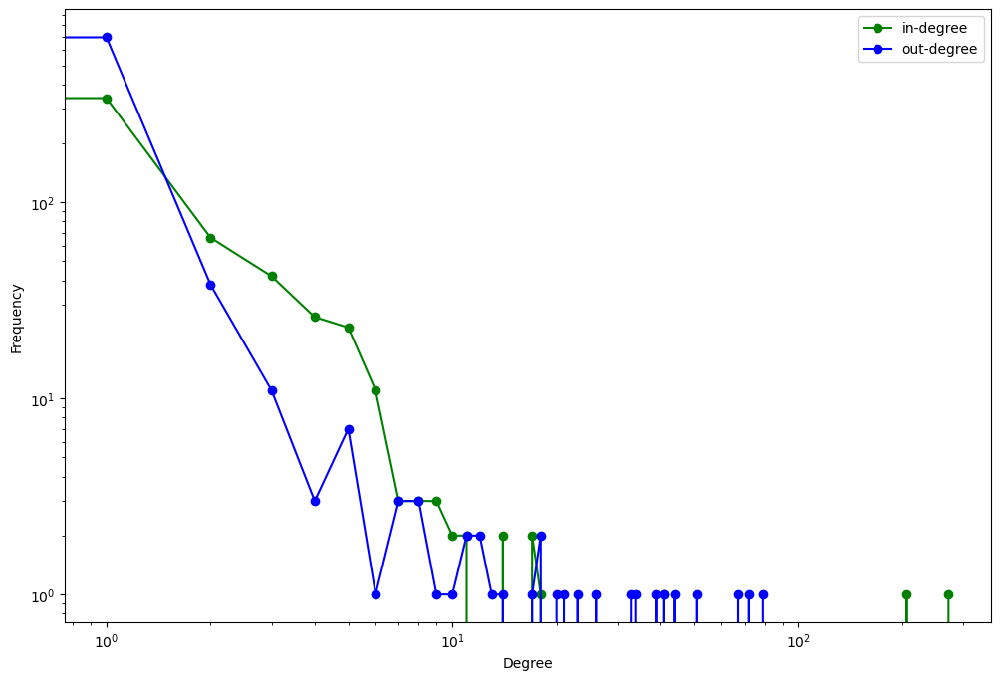

In [216]:
in_degree_freq = degree_histogram_directed(bear_G, in_degree=True)
out_degree_freq = degree_histogram_directed(bear_G, out_degree=True)
degrees = range(len(in_degree_freq))
plt.figure(figsize=(12, 8)) 
plt.loglog(range(len(in_degree_freq)), in_degree_freq, 'go-', label='in-degree') 
plt.loglog(range(len(out_degree_freq)), out_degree_freq, 'bo-', label='out-degree')
plt.legend(loc="upper right")
plt.xlabel('Degree')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

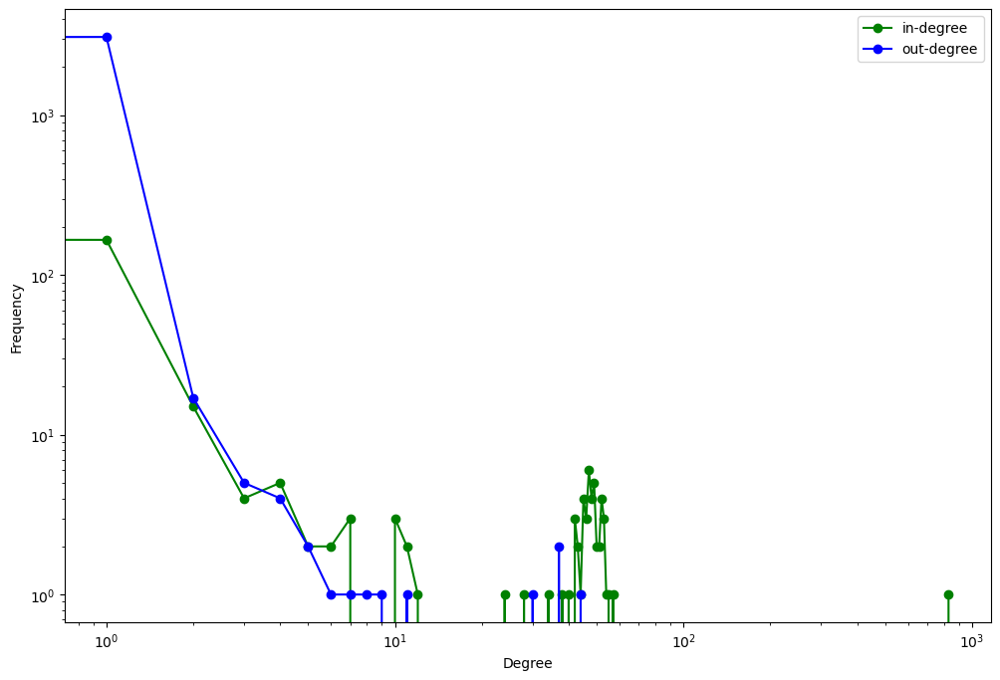

In [207]:
in_degree_freq = degree_histogram_directed(bull_G, in_degree=True)
out_degree_freq = degree_histogram_directed(bull_G, out_degree=True)
degrees = range(len(in_degree_freq))
plt.figure(figsize=(12, 8)) 
plt.loglog(range(len(in_degree_freq)), in_degree_freq, 'go-', label='in-degree') 
plt.loglog(range(len(out_degree_freq)), out_degree_freq, 'bo-', label='out-degree')
plt.legend(loc="upper right")
plt.xlabel('Degree')
plt.ylabel('Frequency')

In [218]:
nx.average_clustering(G)

0.0005468551590043819

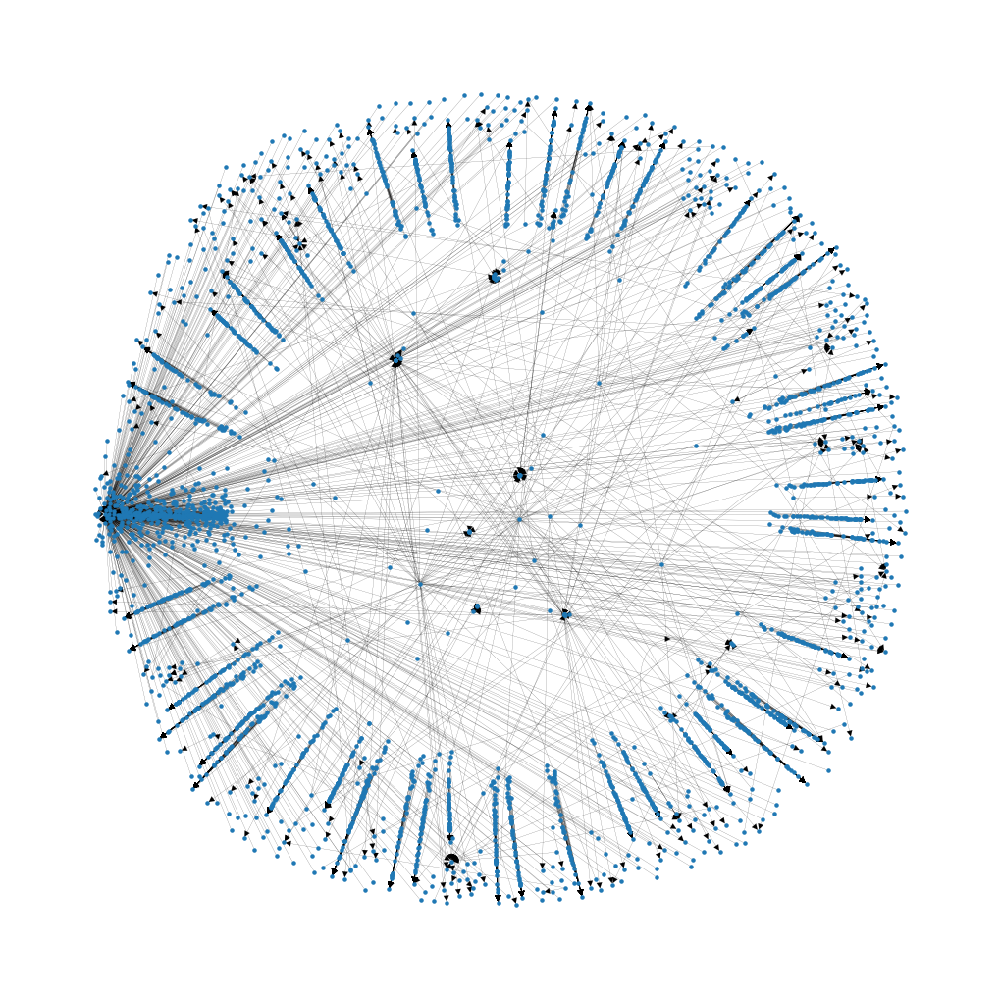

In [210]:
graph_plotter_norm(bull_G)

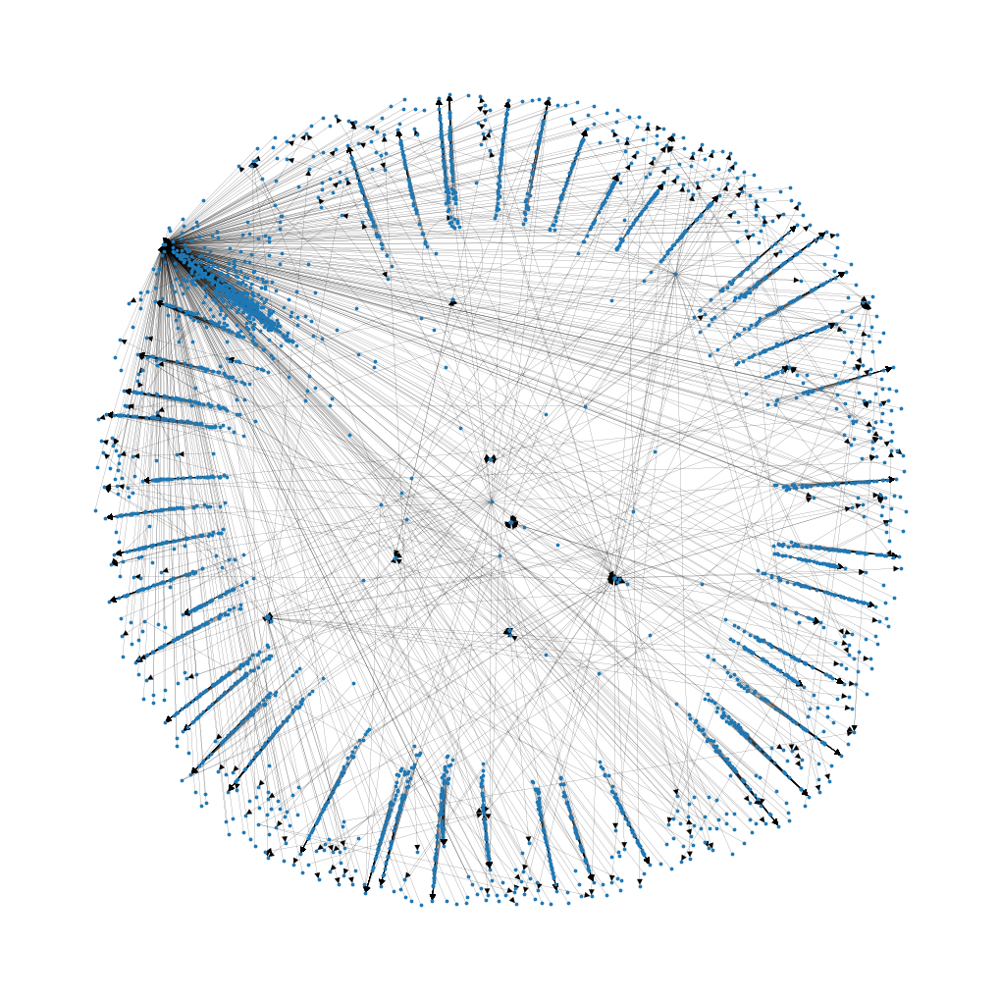

In [204]:
graph_plotter_norm(bull_G)

In [ ]:
graph_plotter_norm(near_G)

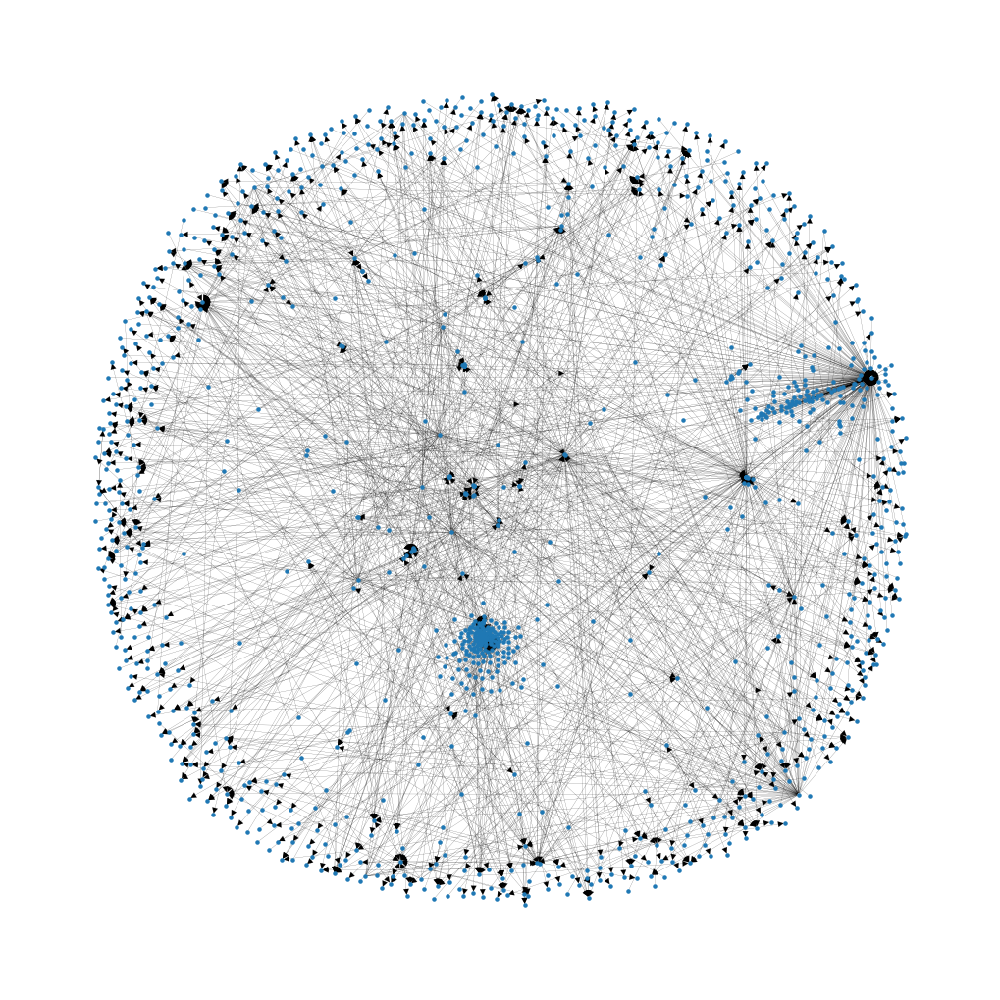

In [220]:
graph_plotter_norm(bear_G)

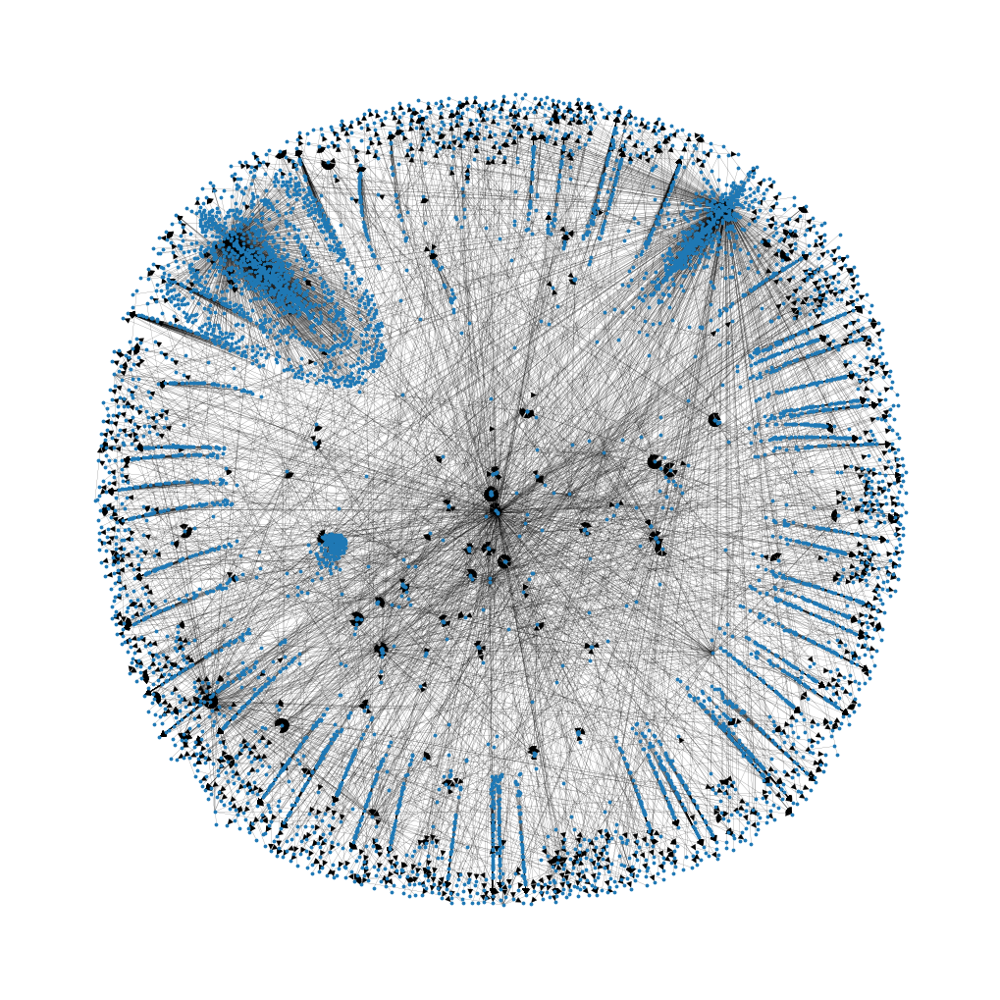

In [158]:
graph_plotter_norm(G)

In [230]:
len(G.edges)

7266

In [227]:
print(nx.average_shortest_path_length(G))

NetworkXError: Graph is not weakly connected.

In [228]:
nx.barycenter(G)

NetworkXNoPath: Input graph DiGraph with 6707 nodes and 7266 edges is disconnected, so every induced subgraph has infinite barycentricity.

In [225]:
len(G.nodes)

6707

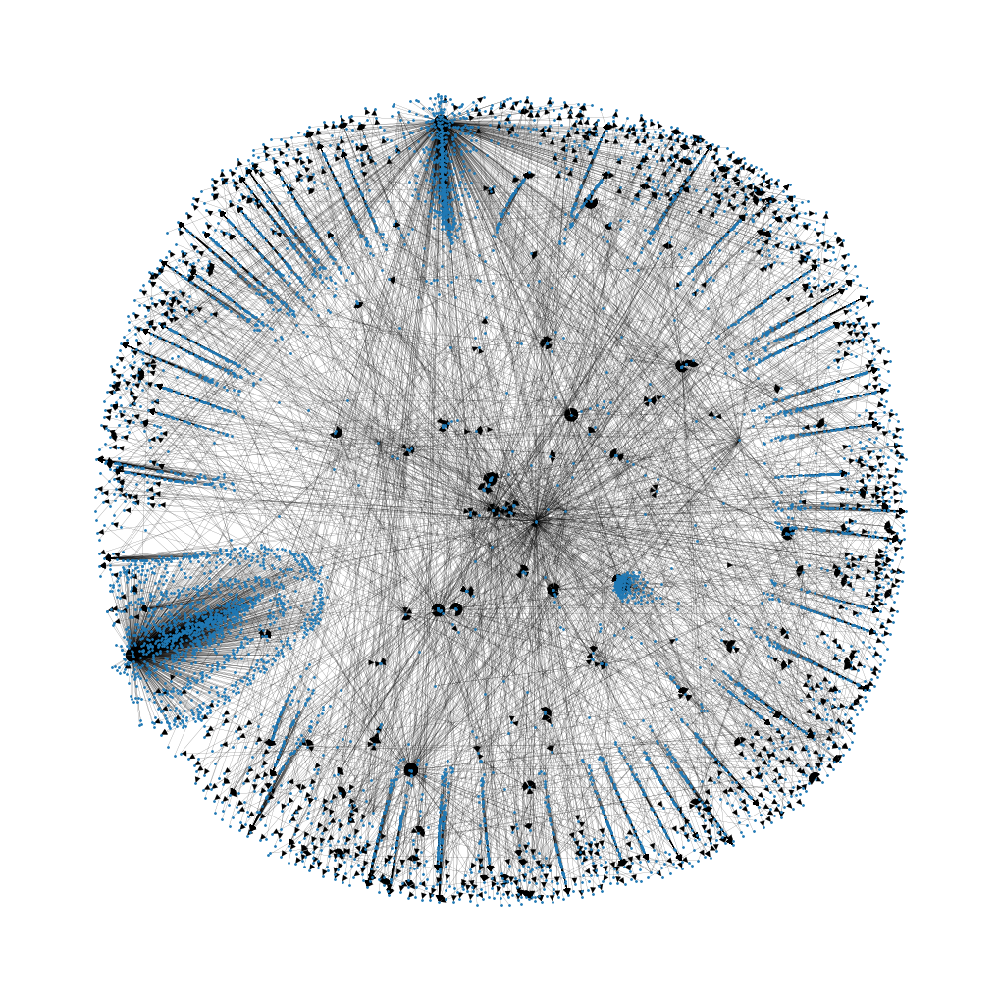

In [155]:
graph_plotter_norm(G)

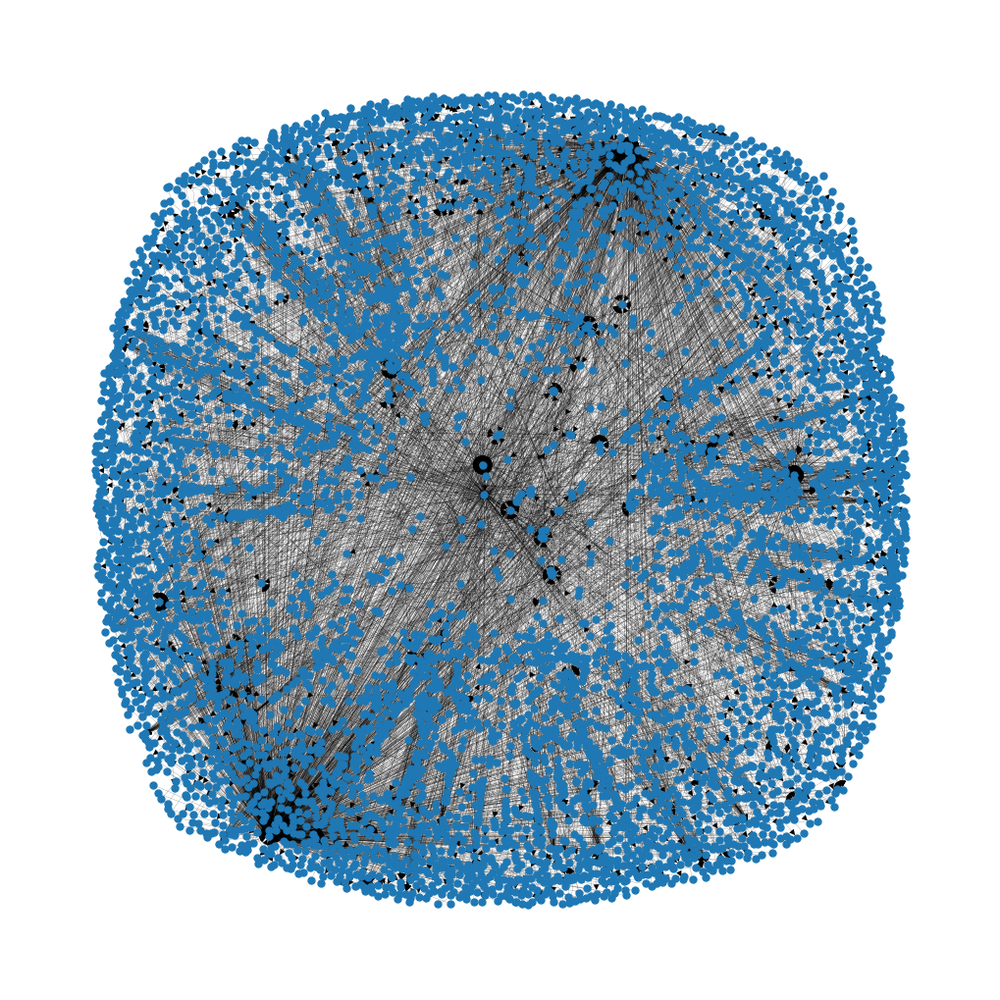

In [150]:
graph_plotter_norm(G)

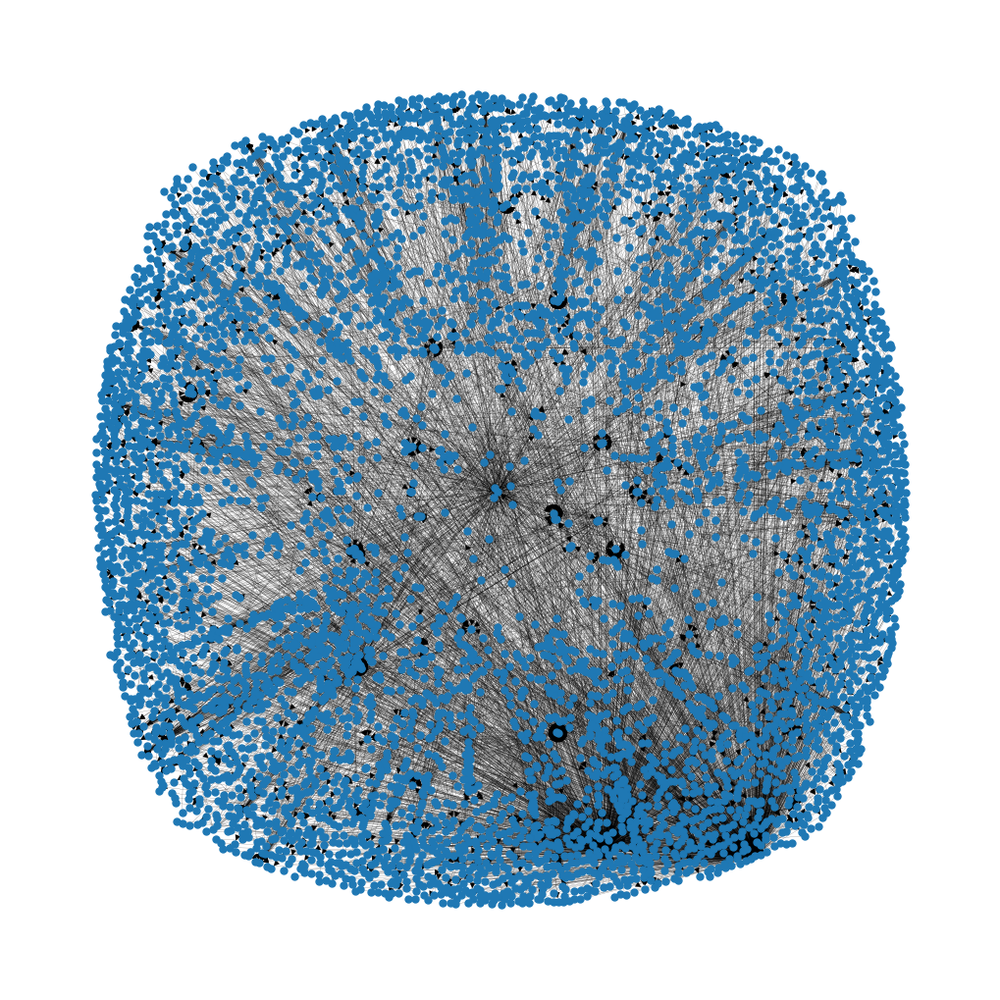

In [149]:
graph_plotter_norm(G)

AttributeError: 'dict_keys' object has no attribute 'index'

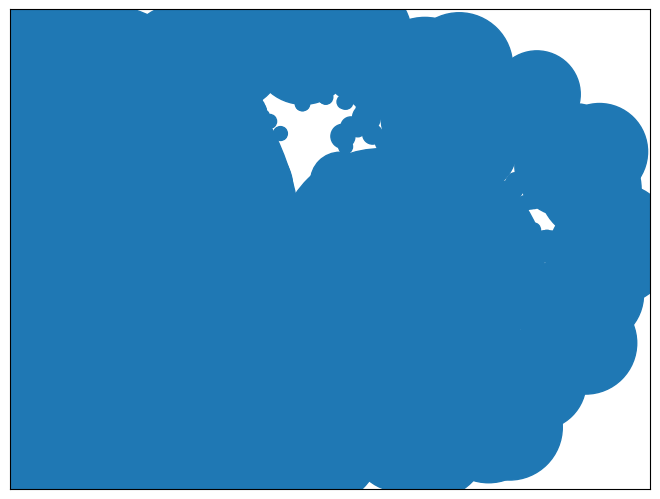

In [140]:
d = dict(G.degree)
nx.draw(G, nodelist=d.keys(), node_size=[v * 100 for v in d.values()])
plt.show()

In [264]:
degrees = [val for (node, val) in G.out_degree()]

In [271]:
nx.average_clustering(bull_G)

0.00020505721456035733

In [269]:
1596/1226

1.301794453507341

In [265]:
sum(degrees)

7266

In [259]:
G.in_degree

InDegreeView({'0xa04afbe1ba0549ee19e055bc8eed84d4a3d7ee6c': 0, '0xb8d2b921c0ea0ca27266fa63907a079ef25084d0': 1297, '0x29d5527caa78f1946a409fa6acaf14a0a4a0274b': 0, '0x73afb71d55a49e8bfbb64e652d98ff7d8fbfe50e': 0, '0x7e2f9620b82292829a309a7ec4f09e77fc61a5fd': 0, '0xd3b91ab87b134c4fb58fabd06ec5bf6df1ee12a9': 0, '0x390a8ee0d3229e65f858ae6d9d26c5b0da6acc28': 0, '0xe48c55b0768c9a6ca5151307ad32677f9f34e29e': 0, '0xfd36669394bacfcffd8d1549516fe0bf7f0f6d3b': 0, '0x483b1bcd5e5399f9c53c15680e3b61dd94e3d0b0': 0, '0x0ca3c47e73d02427a140c13bfa2c0ef977504cca': 0, '0x097b68a7b8bc6b37be834e3874506d8c1f2b55d0': 0, '0x47778a55f2776a57682739c79e72aac3b8054e2a': 0, '0x0491be6a10276f6e8db657a5f83b44c2cec64b5d': 0, '0xd42b680252fe220d2d4a388b6486cdbad188d107': 0, '0x4632926f58f996c404448f2ae6163186f019a006': 0, '0xccb33c7a129043b47973886afede9a072ca10bf3': 0, '0xddbc5e3db2721615f3eb5c86e4b0544c97dda862': 0, '0x892071f985bacaf229873838fb704d6c9f5644e7': 0, '0x1dfcfae8905f2f9a36d6d1856e3b5e510fe73f41': 0, '0x

In [253]:
bull_G.out_degree


total = 0
for n in G.in_degree:
    total+=n[1]

In [256]:
len(bear_G.edges)

1596

In [254]:
total

7266

Text(0, 0.5, 'Frequency')

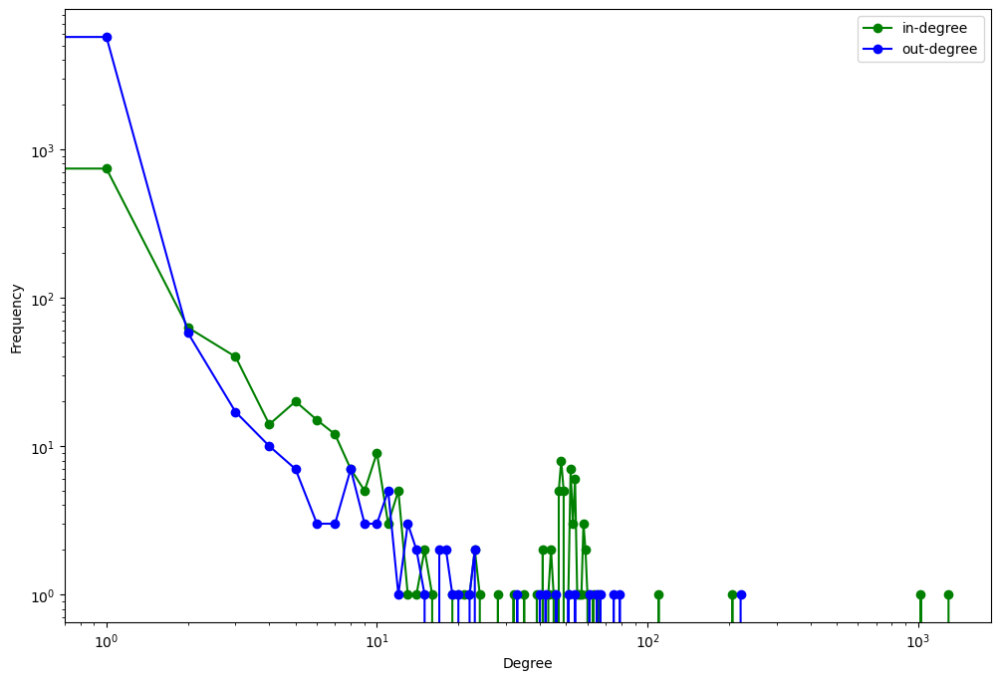

In [136]:
in_degree_freq = degree_histogram_directed(G, in_degree=True)
out_degree_freq = degree_histogram_directed(G, out_degree=True)
degrees = range(len(in_degree_freq))
plt.figure(figsize=(12, 8)) 
plt.loglog(range(len(in_degree_freq)), in_degree_freq, 'go-', label='in-degree') 
plt.loglog(range(len(out_degree_freq)), out_degree_freq, 'bo-', label='out-degree')
plt.legend(loc="upper right")
plt.xlabel('Degree')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

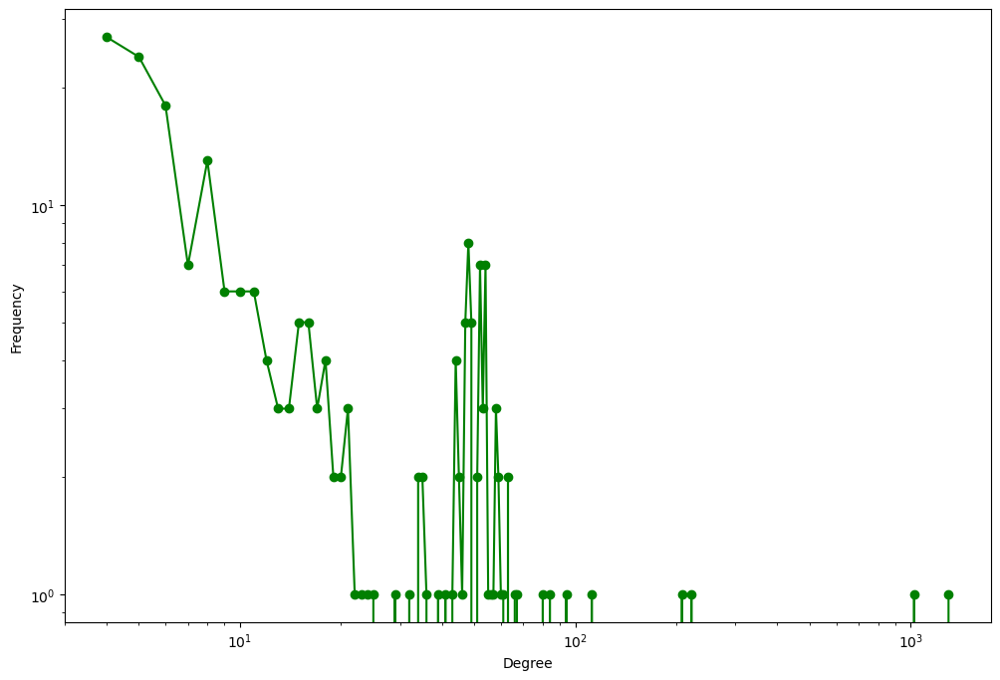

In [128]:
m=4

degree_freq = nx.degree_histogram(G)
degrees = range(len(degree_freq))
plt.figure(figsize=(12, 8)) 
plt.loglog(degrees[m:], degree_freq[m:],'go-') 
plt.xlabel('Degree')
plt.ylabel('Frequency')

In [127]:
M = nx.to_scipy_sparse_matrix(G)
xmin = min([d[1] for d in G.degree()])
indegrees = int(M.sum(0).A[0])
degree = np.bincount(indegrees)
#fit = powerlaw.Fit(np.array(degree)+1, fit_method='KS')
    
    
fig = plt.figure(figsize=(16, 6)) 

plt.subplot(1, 3, 1)
plt.plot(range(len(degree)),degree,'b.')   
plt.loglog()
plt.xlim((min(degree), max(degree)))
plt.xlabel('Degree')
plt.ylabel('P(k)')
plt.show()

/tmp/ipykernel_11404/3582799750.py:1: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `to_scipy_sparse_array` instead.
  M = nx.to_scipy_sparse_matrix(G)


TypeError: only size-1 arrays can be converted to Python scalars

In [232]:
def compute_girvan_newman_modularity(graph):

    communities = girvan_newman(graph)

    node_groups = []
    for com in next(communities):
        node_groups.append(list(com))

    return nx_com.modularity(graph,node_groups)

In [245]:
G

In [244]:
len(G.in_degree)

6707

In [242]:
len(bull_G.nodes)

3341

In [240]:
compute_girvan_newman_modularity(G)

0.1227507631161804

In [238]:
compute_girvan_newman_modularity(bear_G)

0.6297874993661596

In [239]:
compute_girvan_newman_modularity(bull_G)

0.7219653238567693

In [237]:
nx_com.modularity(G,nx_com.louvain_communities(G))

0.944531205680915

In [236]:
nx_com.modularity(bull_G,nx_com.louvain_communities(bull_G))

0.9204669884911931

In [235]:
nx_com.modularity(bear_G,nx_com.louvain_communities(bear_G))

0.915244347463603

In [272]:
def graph_plotter(graph, clist):
    plt.figure(1,figsize=(10,10))
    mappable = plt.cm.ScalarMappable(cmap = plt.cm.jet, norm = plt.Normalize( vmin = min(clist), vmax = max(clist)))
    nx.draw(graph,pos=None,with_labels=False,node_size=50, cmap = plt.cm.jet ,node_color=clist,width=0.1)
    plt.colorbar(mappable)

In [285]:
betweenness_list4 = nx.degree_centrality(bull_G) # use les graph plotter

# we need to do this so attributes are set in les graph
# for respective centrality measure
nx.set_node_attributes(bull_G,betweenness_list4,name='color') 

In [286]:
betweenness_list4 = nx.degree_centrality(bear_G) # use les graph plotter

# we need to do this so attributes are set in les graph
# for respective centrality measure
nx.set_node_attributes(bear_G,betweenness_list4,name='color') 

In [277]:
def les_plotter(graph):
    plt.figure(1,figsize=(10,10))
    mappable = plt.cm.ScalarMappable(cmap = plt.cm.jet, norm = plt.Normalize( vmin = min(nx.get_node_attributes(graph, 'color').values()), vmax = max(nx.get_node_attributes(graph, 'color').values())))
    nx.draw(graph,pos=None,with_labels=False,node_size=25, cmap = plt.cm.jet ,node_color=list(nx.get_node_attributes(graph, 'color').values()),width=0.1)
    plt.colorbar(mappable)

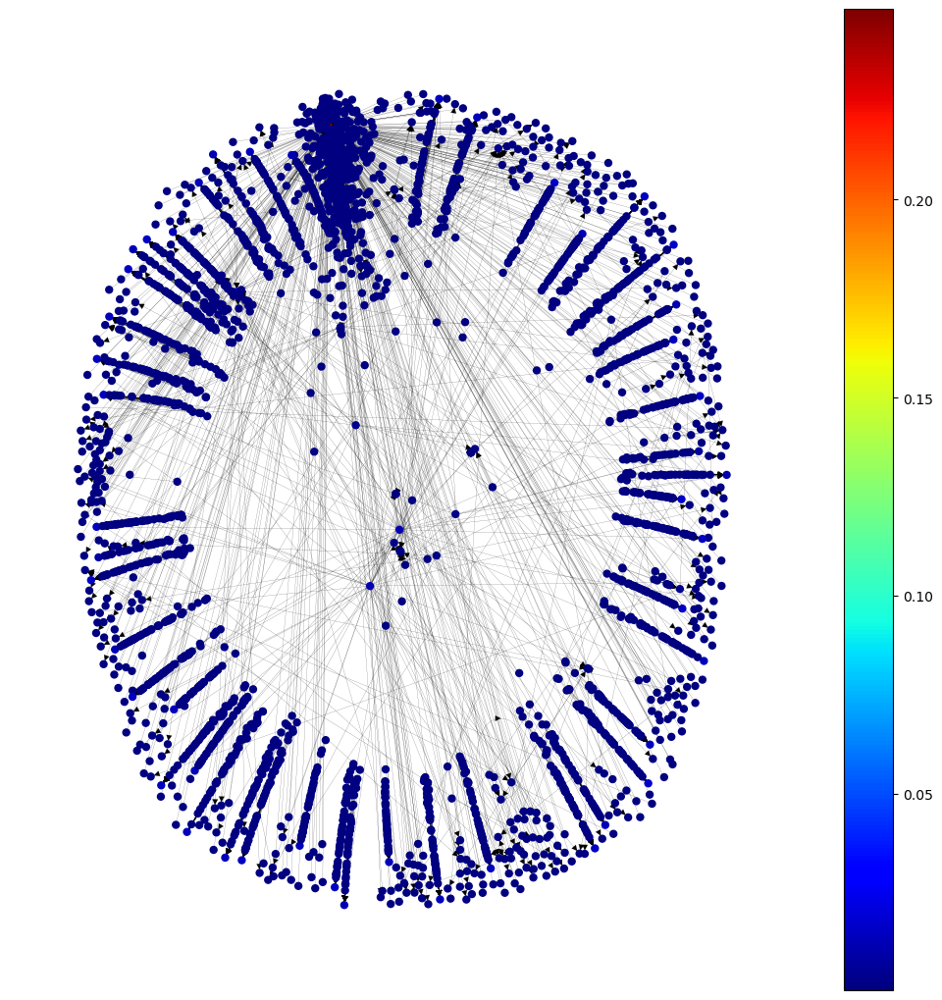

In [287]:
les_plotter(bull_G)

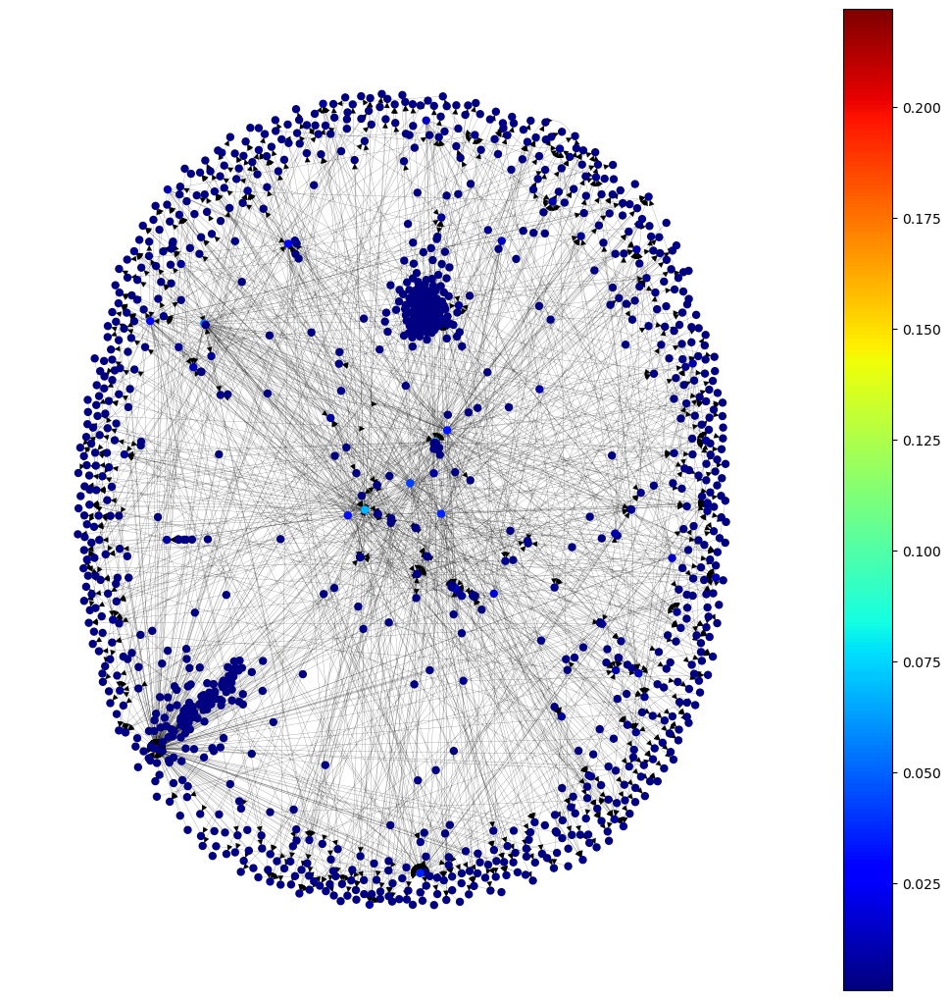

In [288]:
les_plotter(bear_G)

In [ ]:
betweenness_list4 = nx.betweenness_centrality(bull_G) # use les graph plotter

# we need to do this so attributes are set in les graph
# for respective centrality measure
nx.set_node_attributes(bull_G,betweenness_list4,name='color') 

In [ ]:
closeness_list1 = nx.closeness_centrality(bull_G)
ccolor1 = [closeness_list1[i] for i in range(len(closeness_list1))]

In [ ]:
degree_centrality1_list = nx.degree_centrality(bull_G)
dcolor1 = [degree_centrality1_list[i] for i in range(len(degree_centrality1_list))]

In [ ]:
betweenness_list1 = nx.betweenness_centrality(bear_G)
bcolor1 = [betweenness_list1[i] for i in range(len(betweenness_list1))]

In [ ]:
closeness_list1 = nx.closeness_centrality(bull_G)
ccolor1 = [closeness_list1[i] for i in range(len(closeness_list1))]

In [ ]:
degree_centrality1_list = nx.degree_centrality(bull_G)
dcolor1 = [degree_centrality1_list[i] for i in range(len(degree_centrality1_list))]